<a href="https://colab.research.google.com/github/aviano88/Collage-Task/blob/main/Modified_yolov5_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
%pip install --upgrade clearml tensorboard ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 105.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 53.9 MB/s eta 0:00:00
  Attempting uninstall: pyjwt
    Found existing installation: PyJWT 2.3.0
    Uninstalling PyJWT-2.3.0:
      Successfully uninstalled PyJWT-2.3.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.13.0
    Uninstalling tensorboard-2.13.0:
      Successfully uninstalled tensorboard-2.13.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.13.0 requires tensorboard<2.14,>=2.13, but you have tensorboard 2.14.1 which is incompatible.


In [3]:
import clearml
clearml.browser_login()

<IPython.core.display.Javascript object>


🤖 ClearML connected successfully - let's build something! 🚀


In [4]:
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=K5TS42BM430WE8DJ6PEF
%env CLEARML_API_SECRET_KEY=khxChPcGVZGjRaYgM6B3ZSYxEPfJ05CbUnuk4dlrsaDcQDbGEt

env: CLEARML_WEB_HOST=https://app.clear.ml
env: CLEARML_API_HOST=https://api.clear.ml
env: CLEARML_FILES_HOST=https://files.clear.ml
env: CLEARML_API_ACCESS_KEY=K5TS42BM430WE8DJ6PEF
env: CLEARML_API_SECRET_KEY=khxChPcGVZGjRaYgM6B3ZSYxEPfJ05CbUnuk4dlrsaDcQDbGEt


# YOLOv5 on Custom Objects

## How to Train YOLOv5 on Custom Objects

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [5]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 16003, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 16003 (delta 21), reused 20 (delta 13), pack-reused 15967
Receiving objects: 100% (16003/16003), 14.66 MiB | 10.28 MiB/s, done.
Resolving deltas: 100% (10983/10983), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [6]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Oct 10 14:54:23 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [8]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 61.3 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Download Correctly Formatted Custom Dataset

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [9]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="YVBE5WexctgU0qZPXoV6")
project = rf.workspace("hikingequipmentobjectdetectionv1").project("hiking-equipment-object-detection-v2")
dataset = project.version(4).download("yolov5")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 831.4 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.0/69.0 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to hiking-equipment-object-detection-v2-4 in yolov5pytorch:: 100%|██████████| 12160/12160 [00:05<00:00, 2052.43it/s]


In [10]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- air-mineral
- alat-penerangan
- jaket
- tas-gunung
nc: 4
roboflow:
  license: CC BY 4.0
  project: hiking-equipment-object-detection-v2
  url: https://universe.roboflow.com/hikingequipmentobjectdetectionv1/hiking-equipment-object-detection-v2/dataset/4
  version: 4
  workspace: hikingequipmentobjectdetectionv1
test: ../test/images
train: hiking-equipment-object-detection-v2-4/train/images
val: hiking-equipment-object-detection-v2-4/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [11]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

## YOLOv5m6

In [12]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/hub/yolov5m6.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, Fals

In [13]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [14]:
%%writetemplate /content/yolov5/models/custom_yolov5m6.yaml
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 4  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, False]],  # 15

   [-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 19

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 23 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 20], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 26 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 16], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [768, False]],  # 29 (P5/32-large)

   [-1, 1, Conv, [768, 3, 2]],
   [[-1, 12], 1, Concat, [1]],  # cat head P6
   [-1, 3, C3, [1024, False]],  # 32 (P6/64-xlarge)

   [[23, 26, 29, 32], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5, P6)
  ]


## YOLOv5s6

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/hub/yolov5s6.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, Fals

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s6.yaml
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 4  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, False]],  # 15

   [-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 19

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 23 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 20], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 26 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 16], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [768, False]],  # 29 (P5/32-large)

   [-1, 1, Conv, [768, 3, 2]],
   [[-1, 12], 1, Concat, [1]],  # cat head P6
   [-1, 3, C3, [1024, False]],  # 32 (P6/64-xlarge)

   [[23, 26, 29, 32], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5, P6)
  ]

## YOLOv5n6

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/hub/yolov5n6.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, Fals

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5n6.yaml
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 4  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [19,27,  44,40,  38,94]  # P3/8
  - [96,68,  86,152,  180,137]  # P4/16
  - [140,301,  303,264,  238,542]  # P5/32
  - [436,615,  739,380,  925,792]  # P6/64

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [768, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [768]],
   [-1, 1, Conv, [1024, 3, 2]],  # 9-P6/64
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 11
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [768, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 8], 1, Concat, [1]],  # cat backbone P5
   [-1, 3, C3, [768, False]],  # 15

   [-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 19

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 23 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 20], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 26 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 16], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [768, False]],  # 29 (P5/32-large)

   [-1, 1, Conv, [768, 3, 2]],
   [[-1, 12], 1, Concat, [1]],  # cat head P6
   [-1, 3, C3, [1024, False]],  # 32 (P6/64-xlarge)

   [[23, 26, 29, 32], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5, P6)
  ]


# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

## YOLOv5 Medium Model

In [16]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 3 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5m6.yaml --weights /content/yolov5/pretrain-yolov5m.pt --name yolov5m_results  --cache

/content/yolov5
2023-10-10 15:03:17.292365: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-10 15:03:18.202693: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/yolov5/pretrain-yolov5m.pt, cfg=./models/custom_yolov5m6.yaml, data=/content/yolov5/hiking-equipment-object-detection-v2-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5m_results, exist_ok=False, quad=False, cos_lr=Fals

## YOLOv5 Small Model

In [ ]:
# train yolov5s on custom data for 1000 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 450 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s6.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-07-30 19:01:32.409302: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-07-30 19:01:32.468820: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-30 19:01:33.394849: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s6.yaml, data=/content/yolov5/hiking-equipment-object-detection-v2-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=450, batch_size=32, imgsz=640, rect=False, resume=False, nosave=Fals

# Evaluate Custom YOLOv5 Detector Performance

In [17]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

### YOLOv5m Detector Performance

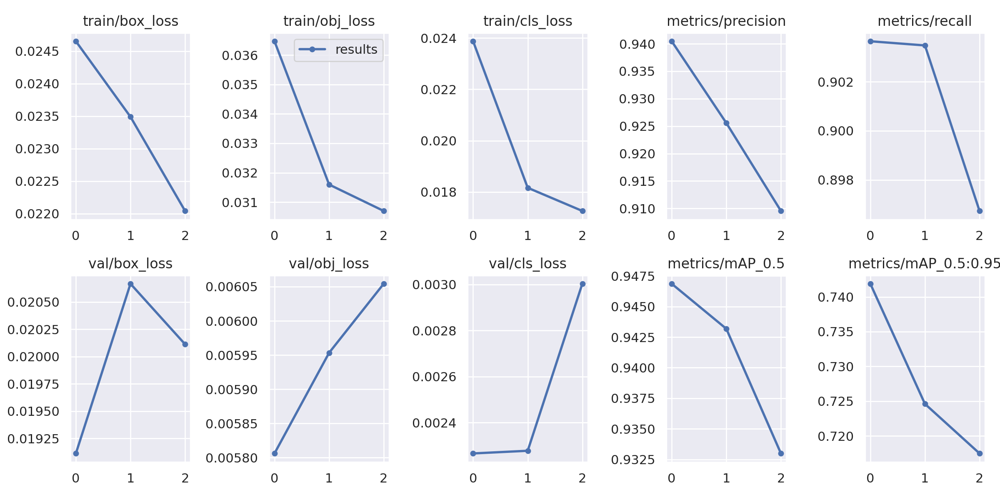

In [19]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results2/results.png', width=1000)  # view results.png


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Yolov5m Confusion Matix



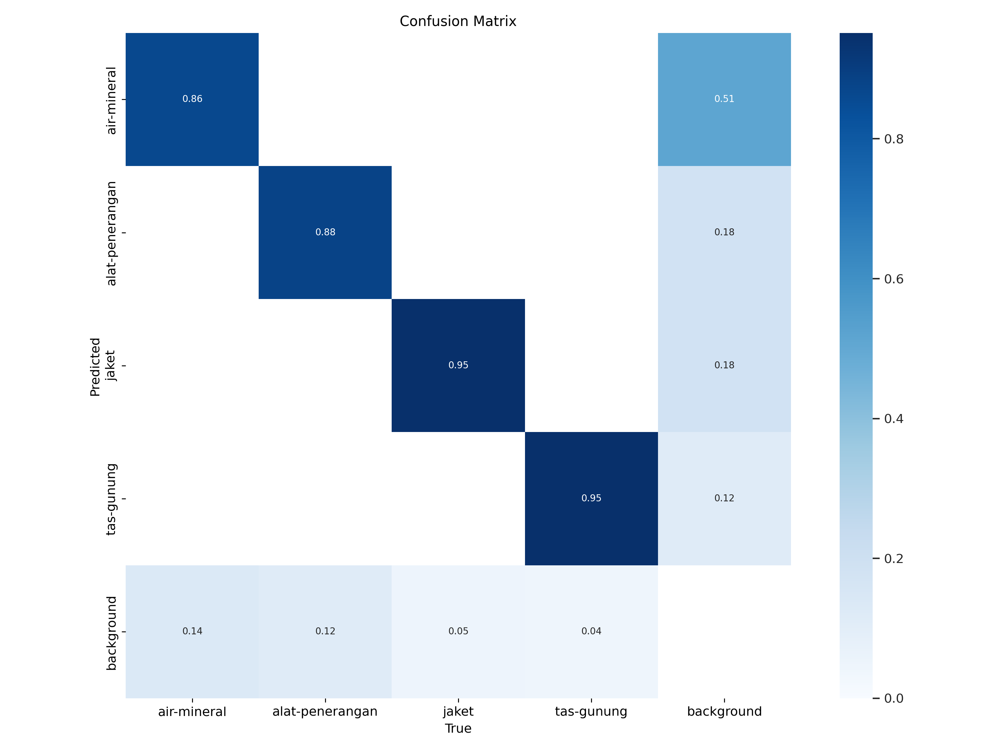

In [ ]:
from IPython.display import Image
print("Yolov5m Confusion Matix\n")
Image(filename='/content/yolov5/runs/train/yolov5m_results/confusion_matrix.png', width=1000)  # confusion_matrix.png

### YOLOv5s Detector Performance

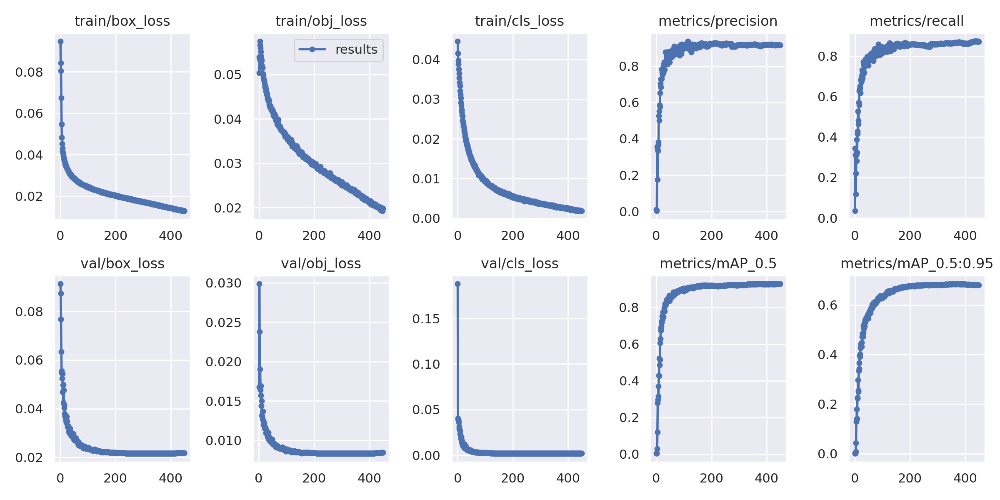

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

Yolov5s Confusion Matix



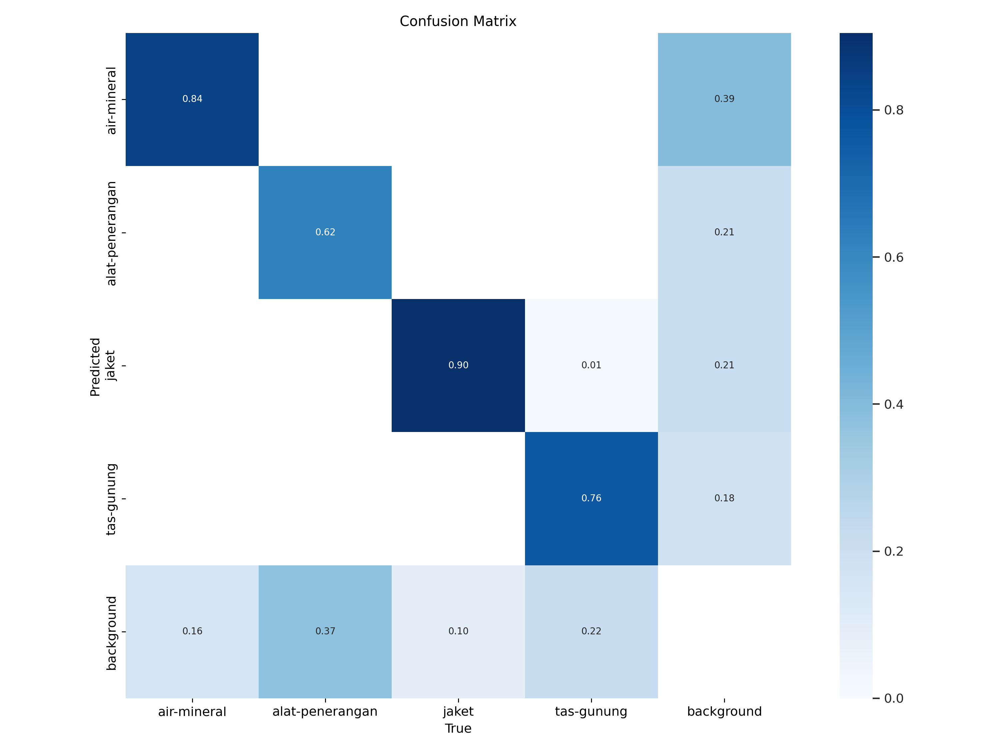

In [ ]:
from IPython.display import Image
print("Yolov5s Confusion Matix\n")
Image(filename='/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png', width=1000)  # confusion_matrix.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


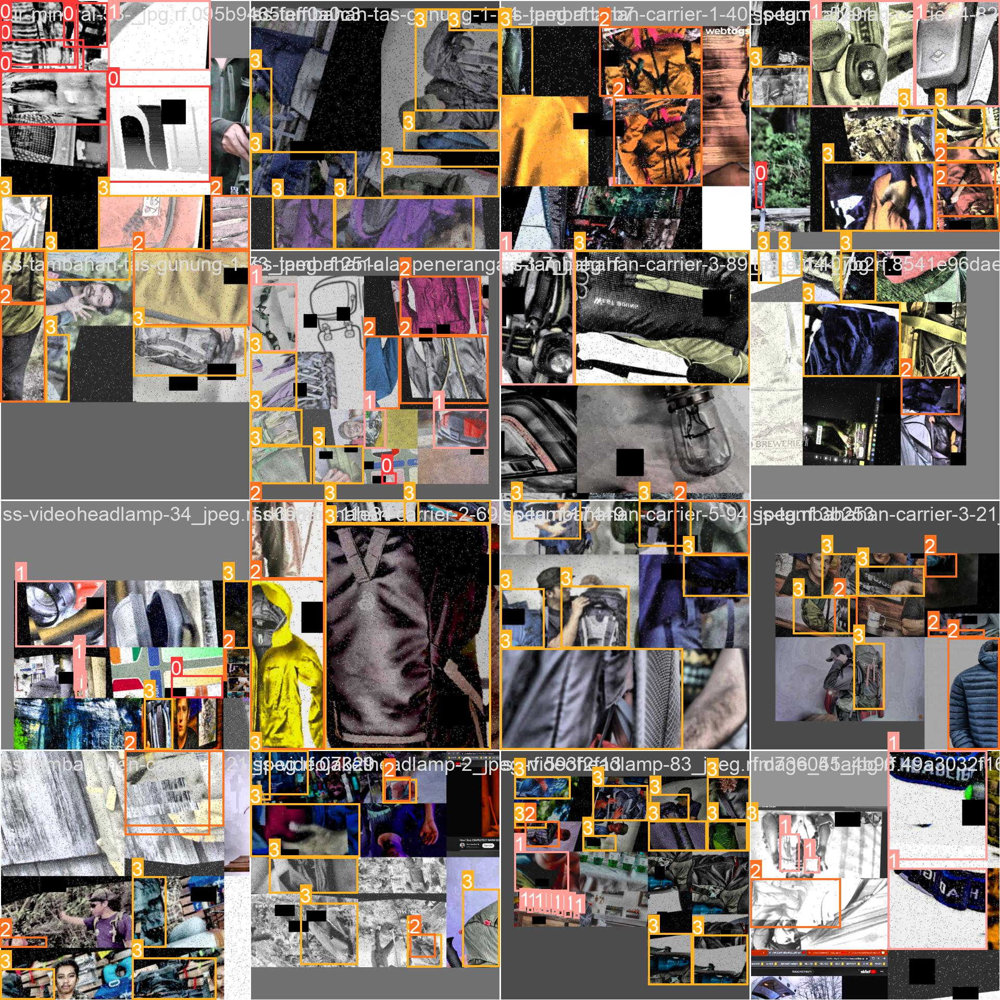

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


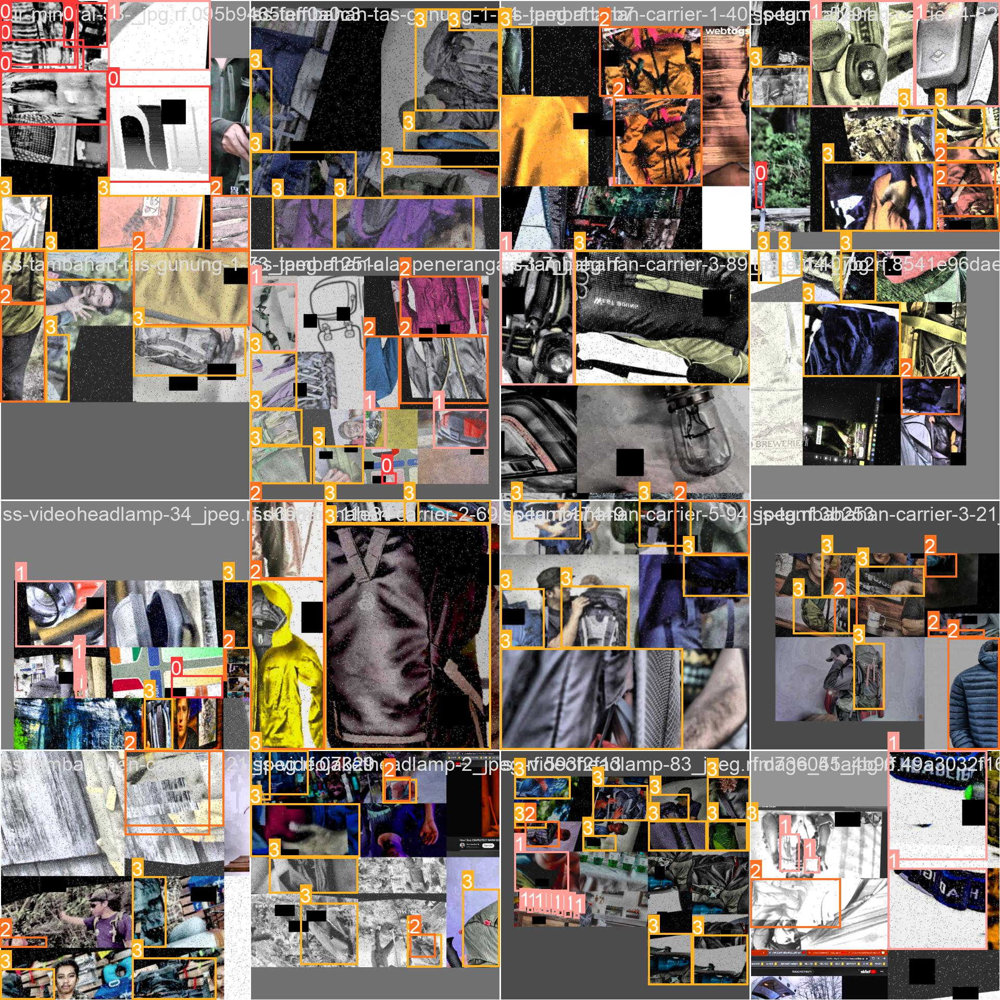

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [ ]:
%ls runs/train/yolov5m_results/weights

best.pt  last.pt


## YOLOv5m6 Interference

In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5m_results/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/hiking-equipment-object-detection-v2-3/test/images/

/content/yolov5
detect: weights=['runs/train/yolov5m_results/weights/best.pt'], source=/content/yolov5/hiking-equipment-object-detection-v2-3/test/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5m6 summary: 276 layers, 35266236 parameters, 0 gradients, 48.9 GFLOPs
image 1/237 /content/yolov5/hiking-equipment-object-detection-v2-3/test/images/Image_100_jpg.rf.75dc4790da213f5b631ed64b06137c91.jpg: 640x640 1 tas-gunung, 9.9ms
image 2/237 /content/yolov5/hiking-equipment-object-detection-v2-3/test/images/Image_10

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## YOLOv5s6 Interference

In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/hiking-equipment-object-detection-v2-3/test/images/

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/hiking-equipment-object-detection-v2-3/test/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5s6 summary: 206 layers, 12319756 parameters, 0 gradients, 16.1 GFLOPs
image 1/237 /content/yolov5/hiking-equipment-object-detection-v2-3/test/images/Image_100_jpg.rf.75dc4790da213f5b631ed64b06137c91.jpg: 640x640 1 tas-gunung, 8.1ms
image 2/237 /content/yolov5/hiking-equipment-object-detection-v2-3/test

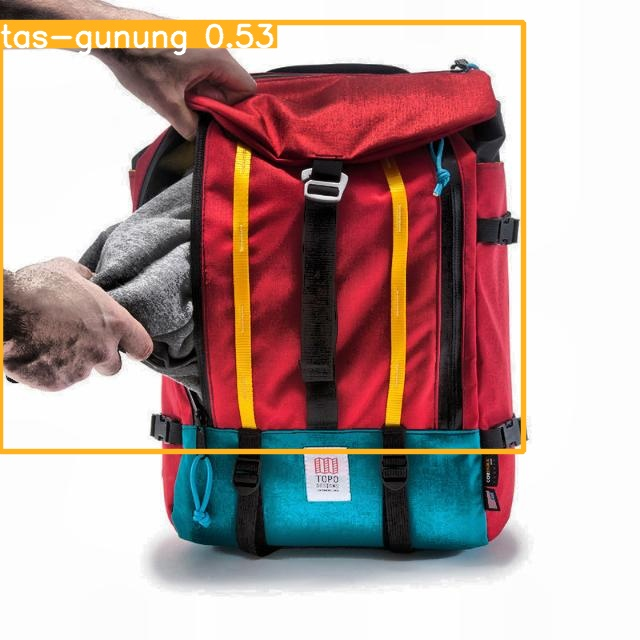

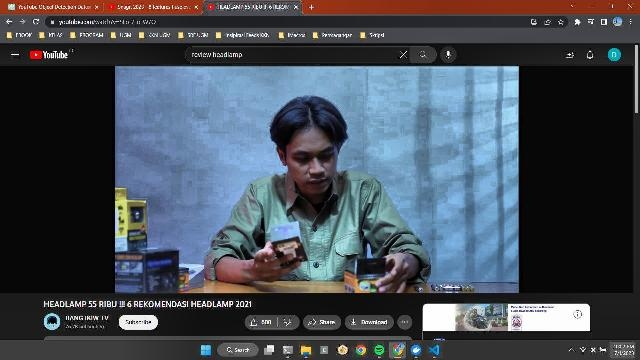

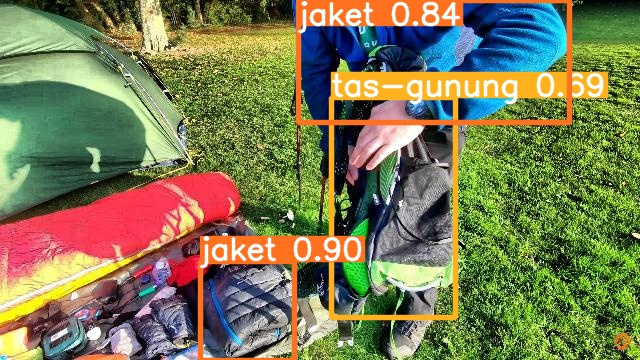

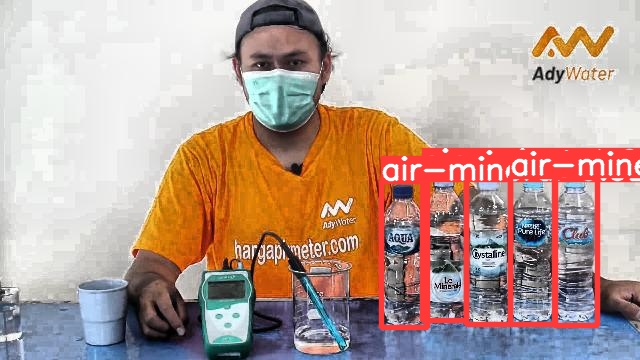

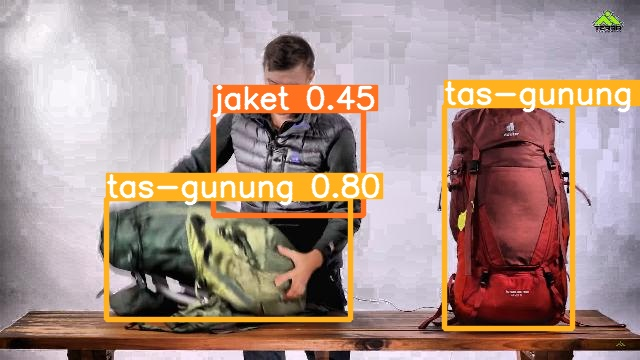

...

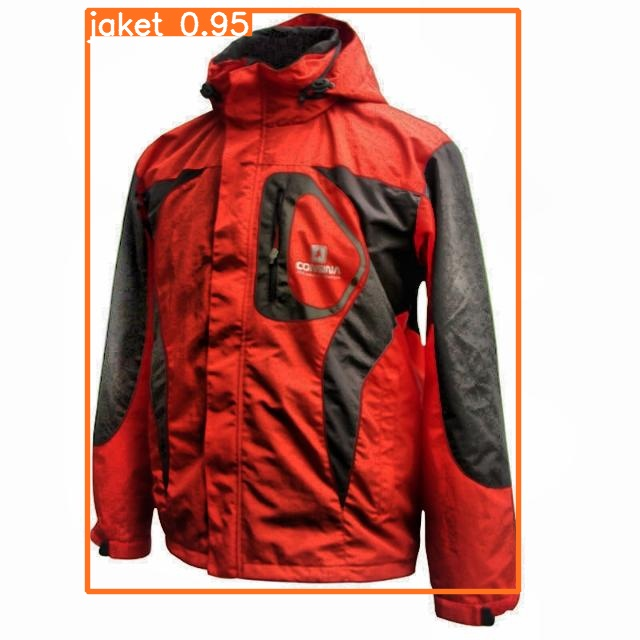

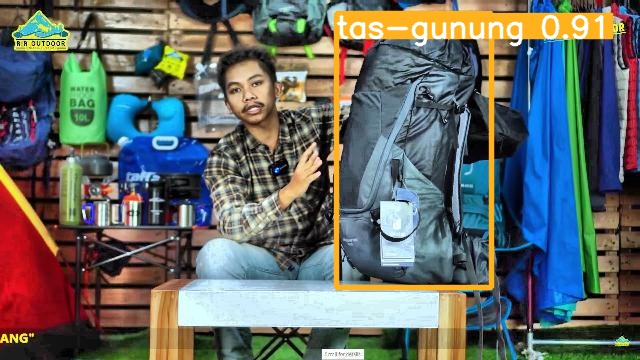

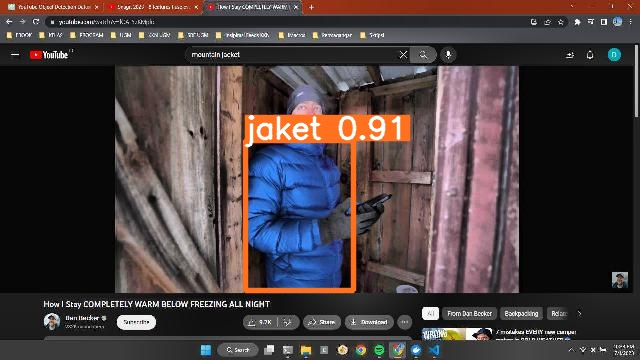

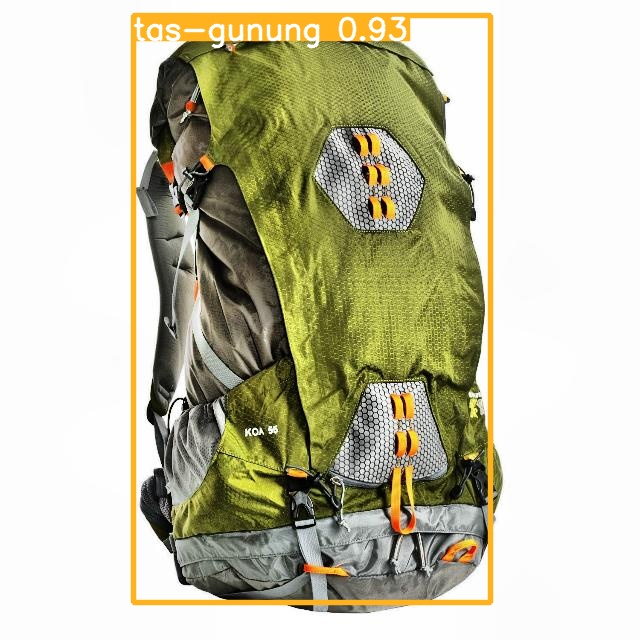

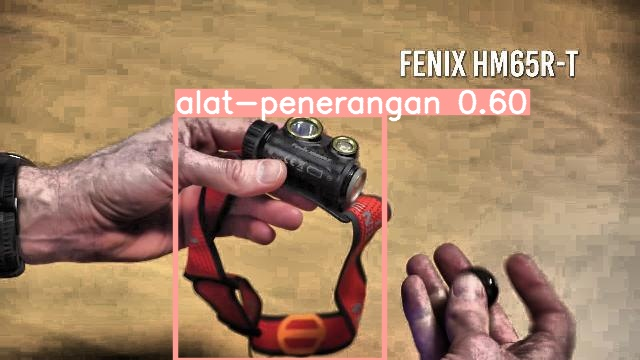

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Deploy Model Weights to Roboflow

Now that you have trained your custom detector, you can upload it to Roboflow to deploy you model to a Hosted API and edge containers.

In [ ]:
project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/yolov5/runs/train/yolov5m_results/")

View the status of your deployment at: https://app.roboflow.com/hikingequipmentobjectdetectionv1/hiking-equipment-object-detection-v2/3
Share your model with the world at: https://universe.roboflow.com/hikingequipmentobjectdetectionv1/hiking-equipment-object-detection-v2/model/3


In [ ]:
#While your deployment is processing, checkout the deployment docs to take your model to most destinations https://docs.roboflow.com/inference

## Run Interference

In [ ]:
import os
import random
import requests


# Load model
model = project.version(dataset.version).model

# Choose random test set image
test_set_loc = "/content/yolov5/hiking-equipment-object-detection-v2-3/train/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("Running inference on " + random_test_image)

# Run inference and get predictions
pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
print(pred)


Running inference on ss-tambahan-airmineral2-98_jpeg.rf.a46459614fda533269ad9432a03a4352.jpg
{'predictions': [{'x': 396.5, 'y': 105.0, 'width': 51.0, 'height': 102.0, 'confidence': 0.9178156852722168, 'class': 'air-mineral', 'image_path': '/content/yolov5/hiking-equipment-object-detection-v2-3/train/images/ss-tambahan-airmineral2-98_jpeg.rf.a46459614fda533269ad9432a03a4352.jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 461.5, 'y': 105.5, 'width': 51.0, 'height': 107.0, 'confidence': 0.9078818559646606, 'class': 'air-mineral', 'image_path': '/content/yolov5/hiking-equipment-object-detection-v2-3/train/images/ss-tambahan-airmineral2-98_jpeg.rf.a46459614fda533269ad9432a03a4352.jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 341.5, 'y': 108.5, 'width': 51.0, 'height': 101.0, 'confidence': 0.9061504602432251, 'class': 'air-mineral', 'image_path': '/content/yolov5/hiking-equipment-object-detection-v2-3/train/images/ss-tambahan-airmineral2-98_jpeg.rf.a46459614fda533269ad9432a

# Model Export

In [ ]:
%pip install -r requirements.txt coremltools onnx onnx-simplifier onnxruntime openvino-dev tensorflow-cpu  # CPU
%pip install -r requirements.txt coremltools onnx onnx-simplifier onnxruntime-gpu openvino-dev tensorflow  # GPU

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 101.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 93.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 119.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 123.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.6/225.6 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 100.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.8/36.8 MB 42.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 93.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 120.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 50.6 MB/s eta 0:00:0

YOLOv5 model export

In [ ]:
%cd /content/yolov5/
!CUDA_VISIBLE_DEVICES=0 python export.py --device 0 --weights runs/train/yolov5m_results/weights/best.pt --include torchscript onnx openvino engine pb tflite


/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/yolov5m_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=0, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx', 'openvino', 'engine', 'pb', 'tflite']
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5m6 summary: 276 layers, 35266236 parameters, 0 gradients, 48.9 GFLOPs

PyTorch: starting from runs/train/yolov5m_results/weights/best.pt with output shape (1, 25500, 9) (67.9 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScript: export success ✅ 2.2s, saved as runs/train/yolov5m_results/weights/best.torchscript (135.2 MB)

ONNX: starting export with onnx 1.14.0...
============= Diagnostic Run to

In [ ]:
%cd /content/yolov5/
!CUDA_VISIBLE_DEVICES=0 python export.py --device 0 --weights runs/train/yolov5s_results/weights/best.pt --include torchscript onnx openvino engine pb tflite


/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=0, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx', 'openvino', 'engine', 'pb', 'tflite']
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5s6 summary: 206 layers, 12319756 parameters, 0 gradients, 16.1 GFLOPs

PyTorch: starting from runs/train/yolov5s_results/weights/best.pt with output shape (1, 25500, 9) (24.0 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScript: export success ✅ 1.5s, saved as runs/train/yolov5s_results/weights/best.torchscript (47.5 MB)

ONNX: starting export with onnx 1.14.0...
============= Diagnostic Run tor

In [ ]:
%cd /content/yolov5/
!CUDA_VISIBLE_DEVICES=0 python export.py --device 0 --weights runs/train/yolov5n_results/weights/best.pt --include torchscript onnx openvino engine pb tflite


/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/yolov5n_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=0, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx', 'openvino', 'engine', 'pb', 'tflite']
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)

Fusing layers... 
custom_YOLOv5n6 summary: 206 layers, 3093052 parameters, 0 gradients, 4.2 GFLOPs

PyTorch: starting from runs/train/yolov5n_results/weights/best.pt with output shape (1, 25500, 9) (6.3 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScript: export success ✅ 1.4s, saved as runs/train/yolov5n_results/weights/best.torchscript (12.3 MB)

ONNX: starting export with onnx 1.14.0...
============= Diagnostic Run torch.

# ZIP & Copy to google drive

In [ ]:
import shutil
import os

from google.colab import drive
drive.mount('/content/gdrive')

# Define the source and target folder paths
source_folder_path = "/content/yolov5"
target_folder_name = "my-yolov5-v3-1"
target_folder_path = "/content/gdrive/MyDrive/" + target_folder_name

# Create the target folder in Google Drive
os.makedirs(target_folder_path, exist_ok=True)

# Zip the source folder
zip_file_path = shutil.make_archive(target_folder_path, 'zip', source_folder_path)

# Get the zip file status and size
zip_file_size = os.path.getsize(zip_file_path)
print("ZIP file created successfully.")
print(f"ZIP file size: {zip_file_size} bytes")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ZIP file created successfully.
ZIP file size: 878154349 bytes


In [ ]:
# Move the ZIP file to Google Drive
zip_file_destination = target_folder_path + "/" + target_folder_name + ".zip"
shutil.move(zip_file_path, zip_file_destination)

print("ZIP file uploaded successfully to Google Drive.")

ZIP file uploaded successfully to Google Drive.


## The Project Tree

In [ ]:
!apt-get install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 9 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (55.3 kB/s)
Selecting previously unselected package tree.
(Reading database ... 120493 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [ ]:
!tree -L 3 /content/yolov5 #you can adjust the level by changing the number

/content/yolov5
├── benchmarks.py
├── CITATION.cff
├── classify
│   ├── predict.py
│   ├── train.py
│   ├── tutorial.ipynb
│   └── val.py
├── CONTRIBUTING.md
├── data
│   ├── Argoverse.yaml
│   ├── coco128-seg.yaml
│   ├── coco128.yaml
│   ├── coco.yaml
│   ├── GlobalWheat2020.yaml
│   ├── hyps
│   │   ├── hyp.no-augmentation.yaml
│   │   ├── hyp.Objects365.yaml
│   │   ├── hyp.scratch-high.yaml
│   │   ├── hyp.scratch-low.yaml
│   │   ├── hyp.scratch-med.yaml
│   │   └── hyp.VOC.yaml
│   ├── ImageNet.yaml
│   ├── images
│   │   ├── bus.jpg
│   │   └── zidane.jpg
│   ├── Objects365.yaml
│   ├── scripts
│   │   ├── download_weights.sh
│   │   ├── get_coco128.sh
│   │   ├── get_coco.sh
│   │   └── get_imagenet.sh
│   ├── SKU-110K.yaml
│   ├── VisDrone.yaml
│   ├── VOC.yaml
│   └── xView.yaml
├── detect.py
├── export.py
├── hiking-equipment-object-detection-v2-3
│   ├── data.yaml
│   ├── README.dataset.txt
│   ├── README.roboflow.txt
│   ├── test
│   │   ├── images
│   │   └── labels
│   

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)